# Supervised classification Workflow Example

## Support Vector Machine 

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/emanuel-gf/nickyspatial/blob/dev-teste/docs/examples/supervised_classification_svm.ipynb)


[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/github.com/emanuel-gf/nickyspatial/blob/dev-teste/docs/examples/supervised_classification_svm.ipynb)

This example explains how to perform supervised classification.

## Google Colab

If you are in google colab please run this cell here:


In [ ]:
!pip install rasterio

In [ ]:
import sys
import os

# Clone the repository
!git clone -b dev-teste https://github.com/emanuel-gf/nickyspatial


# Add the repository to Python path
repo_path = '/content/nickyspatial/nickyspatial'  # Default Colab path
if repo_path not in sys.path:
    sys.path.append(repo_path)
    
##Import 
from nickyspatial.core.segmentation import (
    SlicSegmentation,
    FelzenszwalbSegmentation,
    WatershedSegmentation,
    RegularGridSegmentation
)

from nickyspatial.stats.spectral import (
    attach_ndvi,
    attach_spectral_indices,
    attach_spectral_index,
    attach_multiple_spectral_indices
       
)
# Now import everything from your local version
from nickyspatial import (
    LayerManager,
    SlicSegmentation,
    #FelzenszwalbSegmentation,
    #WatershedSegmentation,
    RuleSet,
    attach_ndvi,
    attach_shape_metrics,
    attach_spectral_indices,
    layer_to_raster,
    layer_to_vector,
    plot_classification,
    plot_sample,
    plot_layer,
    plot_layer_interactive,
    read_raster,
    plot_layer_interactive_plotly,
    MergeRuleSet,
    EnclosedByRuleSet,
    TouchedByRuleSet,
    SupervisedClassifier, 
    Layer  
)

## Setup & Imports

We begin by importing the required modules and setting up the environment. & Download the sample quickbird satellite image for our module

In [ ]:
import sys
import importlib

# Clear any existing nickyspatial modules from cache
modules_to_remove = [key for key in sys.modules.keys() if key.startswith('nickyspatial')]
for module in modules_to_remove:
    del sys.modules[module]

# Add your local path with highest priority
sys.path.insert(0, "../../")

# Set up autoreload for development
%load_ext autoreload
%autoreload 2


# Verify you're using local version
import inspect
print("LayerManager from:", inspect.getfile(LayerManager))
print("SupervisedClassifier from:", inspect.getfile(SupervisedClassifier))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
LayerManager from: d:\Desktop\COPERNICUS\Classes\2-Semester\Application-Development\nickyspatial\docs\examples\../..\nickyspatial\core\layer.py
SupervisedClassifier from: d:\Desktop\COPERNICUS\Classes\2-Semester\Application-Development\nickyspatial\docs\examples\../..\nickyspatial\core\classifier.py


## Summary

In this notebook we will perform following steps
- Load a sample raster image.
- Perform different segmentation algorithms on the raster.
- Add NDVI feature.
- Add NDWI and NDBI index
- Define classes and sample collection
- Apply supervised classification using Support Vector Classifier
- Explore additional funtions: Merge_regions, Enclosed_by, Touched_by

In [2]:
import os
import requests
import matplotlib.pyplot as plt
import pandas as pd

#from nickyspatial import (
#    LayerManager,
#    SlicSegmentation,
#    RuleSet,
#    attach_ndvi,
#    attach_shape_metrics,
#    attach_spectral_indices,
#    layer_to_raster,
#    layer_to_vector,
#    plot_classification,
#    plot_sample,
#    plot_layer,
#    plot_layer_interactive,
#    read_raster,
#    plot_layer_interactive_plotly,
#    MergeRuleSet,
#    EnclosedByRuleSet,
#    TouchedByRuleSet,
#    SupervisedClassifier,
#    Layer  
#)

output_dir = "output"
os.makedirs(output_dir, exist_ok=True)


data_dir = "data"
os.makedirs(data_dir, exist_ok=True)

raster_path = os.path.join(data_dir, "sample.tif")


if not os.path.exists(raster_path):
    url = "https://github.com/kshitijrajsharma/nickyspatial/raw/refs/heads/master/data/sample.tif"
    print(f"Downloading sample raster from {url}...")
    response = requests.get(url)
    response.raise_for_status()  # Ensure the download succeeded
    with open(raster_path, "wb") as f:
        f.write(response.content)
    print(f"Downloaded sample raster to {raster_path}")
else:
    print(f"Using existing raster at: {raster_path}")

Using existing raster at: data\sample.tif


## Reading the Raster

We now read the raster data and print some basic information about the image.

In [3]:
image_data, transform, crs = read_raster(raster_path)
print(f"Image dimensions: {image_data.shape}")
print(f"Coordinate system: {crs}")

Image dimensions: (4, 877, 1164)
Coordinate system: PROJCS["WGS 84 / UTM zone 54N",GEOGCS["WGS 84",DATUM["World Geodetic System 1984",SPHEROID["WGS 84",6378137,298.257223563]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",141],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]


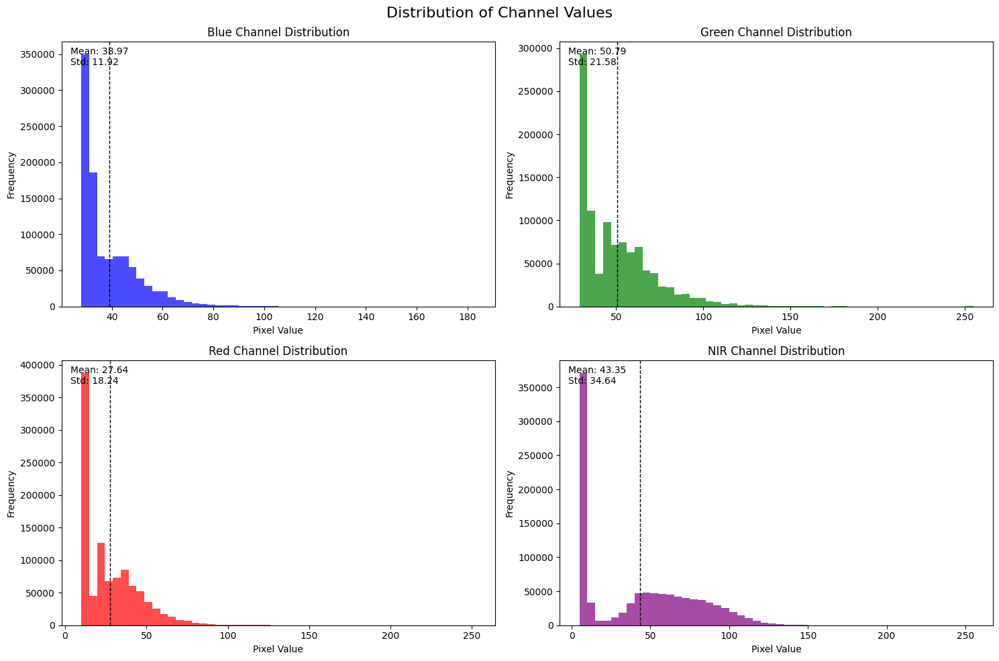


Blue Channel Statistics:
Min: 28.00
Max: 183.00
Mean: 38.97
Std: 11.92

Green Channel Statistics:
Min: 29.00
Max: 255.00
Mean: 50.79
Std: 21.58

Red Channel Statistics:
Min: 10.00
Max: 252.00
Mean: 27.64
Std: 18.24

NIR Channel Statistics:
Min: 5.00
Max: 255.00
Mean: 43.35
Std: 34.64


In [52]:
import matplotlib.pyplot as plt
import numpy as np

# Set up the figure with 4 subplots (one for each channel)
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Distribution of Channel Values', fontsize=16)

# Channel names
channel_names = ['Blue', 'Green', 'Red', 'NIR']
colors = ['blue', 'green', 'red', 'purple']

# Plot histogram for each channel
for idx, (ax, name, color) in enumerate(zip(axes.flat, channel_names, colors)):
    # Create histogram
    ax.hist(image_data[idx].flatten(), bins=50, color=color, alpha=0.7)
    ax.set_title(f'{name} Channel Distribution')
    ax.set_xlabel('Pixel Value')
    ax.set_ylabel('Frequency')
    
    # Add mean and std annotations
    mean_val = np.mean(image_data[idx])
    std_val = np.std(image_data[idx])
    ax.axvline(mean_val, color='k', linestyle='dashed', linewidth=1)
    ax.text(0.02, 0.98, f'Mean: {mean_val:.2f}\nStd: {std_val:.2f}', 
            transform=ax.transAxes, verticalalignment='top')

plt.tight_layout()
plt.show()

# Print basic statistics
for idx, name in enumerate(channel_names):
    print(f"\n{name} Channel Statistics:")
    print(f"Min: {np.min(image_data[idx]):.2f}")
    print(f"Max: {np.max(image_data[idx]):.2f}")
    print(f"Mean: {np.mean(image_data[idx]):.2f}")
    print(f"Std: {np.std(image_data[idx]):.2f}")

 -- Visualizing the image 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the Red and NIR channels
image_data_red_nir = image_data[1:4, :, :]  # Shape: (2, 877, 1164)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plot original image (RGB)
rgb_composite = np.dstack((image_data[2], image_data[1], image_data[0]))  # RGB composite
ax1.imshow(rgb_composite)
ax1.set_title('Original Image (RGB)')
ax1.axis('off')

# Nir in the Blue channel, Red in the Red channel, and Green in the Green channel
red_nir_composite = np.dstack((image_data_red_nir[1], image_data_red_nir[0], image_data_red_nir[2]))
ax2.imshow(red_nir_composite)
ax2.set_title('NIR on the blue channel')
ax2.axis('off')

plt.tight_layout()
plt.show()

# Print shapes for verification
print(f"Original image shape: {image_data.shape}")
print(f"Red-NIR image shape: {image_data_red_nir.shape}")

## Testing different segmentation types

Here we perform different segmentation strategies with different parameters.
A `LayerManager` is used to keep track of all layers created in the process.
Nickyspatial packages uses a layer object which is an underlying vector segmentation tied up to the raster, similar concept as layer in ecognition

In [ ]:
# Initialize LayerManager
manager = LayerManager()

## --------------------------
segmenter = SlicSegmentation(scale=75, compactness=0.80)
slic_segmentation_layer = segmenter.execute(
    image_data,
    transform,
    crs,
    layer_manager=manager,
    layer_name="Base_Segmentation",
)

print("Segmentation layer created:")
print(slic_segmentation_layer)

## -------------------
segmenter = FelzenszwalbSegmentation(scale=75, sigma=0.5, min_size=50)
felzenszwalb_segmentation_layer = segmenter.execute(
    image_data,
    transform,
    crs,
    layer_manager=manager,
    layer_name="Felzenszwalb_Segmentation",
)

print("Felzenszwalb segmentation layer created:")
print(felzenszwalb_segmentation_layer)

## -------------------
segmenter = RegularGridSegmentation(
    grid_size=(100, 100),
    overlap=0,
    boundary_handling='pad'
)
grid_layer = segmenter.execute(
    image_data,
    transform,
    crs,
    layer_manager=manager,
    layer_name="Regular_Grid_100x100"
)
print("Regular grid segmentation layer created:")
print(grid_layer)   

Number of segments: 833
Segmentation layer created:
Layer 'Base_Segmentation' (type: segmentation, parent: None, objects: 823)
Felzenszwalb - Processing 877x1164 image with 4 bands
Felzenszwalb segmentation layer created:
Layer 'Felzenszwalb_Segmentation' (type: segmentation, parent: None, objects: 2056)
RegularGrid - Processing 877x1164 image with 4 bands
Grid size: (50, 50), Overlap: 0, Boundary: pad
Creating 18x24 = 432 segments
Padded image to (900, 1200) (added 23x36 pixels)
Regular grid segmentation layer created:
Layer 'Regular_Grid_50x50' (type: segmentation, parent: None, objects: 432)


In [ ]:
## Dummy implementation of WatershedSegmentation
# segmenter = WatershedSegmentation(n_points=1000,
#                                   compactness=0.1,
#                                   preprocessing='sobel',
#                                   #connectivity=1
#                                   )
# watershed_segmentation_layer = segmenter.execute(
#     image_data,
#     transform,
#     crs,
#     layer_manager=manager,
#     layer_name="Watershed_Segmentation",
# )

# print("Watershed segmentation layer created:")
# print(watershed_segmentation_layer)

Watershed - Processing 877x1164 image with 4 bands
Using 1000 seed points with sobel edge detection
Generated 972 seed points
Watershed segmentation layer created:
Layer 'Watershed_Segmentation' (type: segmentation, parent: None, objects: 972)


### Visualizing Segmentation

We utilize the built-in plotting function to visualize the segmentation. The image will be displayed inline.

In [ ]:
# plt.close("all")
# %matplotlib inline
fig1 = plot_layer(layer=slic_segmentation_layer,
                  image_data=image_data,
                  rgb_bands=(3, 2, 1),
                  title="Slic Segmentation",
                  show_boundaries=True,
                  figsize=(10,8))

fig2 = plot_layer(layer=felzenszwalb_segmentation_layer,
                  image_data=image_data,
                  title="Felzenswalb Segmentation",
                  rgb_bands=(3, 2, 1),
                  show_boundaries=True,
                  figsize=(10,8))

fig3 = plot_layer(layer=grid_layer,
                  image_data=image_data,
                  title="Chessboard Segmentation",
                  rgb_bands=(3, 2, 1),
                  show_boundaries=True,
                  figsize=(10,8))
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

## Adding Indexes features

We decided to move on with the Felzenswalb segmentation!

In [34]:
felzenszwalb_segmentation_layer.objects.columns

Index(['segment_id', 'area_pixels', 'area_units', 'geometry', 'band_1_mean',
       'band_1_std', 'band_1_min', 'band_1_max', 'band_1_median',
       'band_2_mean', 'band_2_std', 'band_2_min', 'band_2_max',
       'band_2_median', 'band_3_mean', 'band_3_std', 'band_3_min',
       'band_3_max', 'band_3_median', 'band_4_mean', 'band_4_std',
       'band_4_min', 'band_4_max', 'band_4_median'],
      dtype='object')

In [69]:
# We move forward with Felzenswalb
segmentation_layer = felzenszwalb_segmentation_layer.copy()

## METHODS to attach Indices and metrics

# Attach NDVI stats at each segmented object
segmentation_layer.attach_function(
    attach_ndvi,
    name="ndvi_stats",
    nir_column="band_4_mean",
    red_column="band_3_mean",
    output_column="NDVI",
)

## Attach NDVI and NDWI as default indices from the function 
segmentation_layer.attach_function(
    attach_spectral_indices,
    name="spectral_indices",
    bands={
        "blue": "band_1_mean",
        "green": "band_2_mean",
        "red": "band_3_mean",
        "nir": "band_4_mean",
    }
)

## Applying a custom spectral index
segmentation_layer.attach_function(
    attach_spectral_index,
    name="custom_vegetation_index",
    index_name="GBNDVI", #Green-Blue Normalized Difference Vegetation Index
    formula="(N-(G+B))/(N+(G+B))",
    bands={
        "N": "band_4_mean",
        "R": "band_3_mean",
        "B": "band_1_mean",
        "G": "band_2_mean"
    }
)

# Attach metrics for the objects generated by the segmentation
segmentation_layer.attach_function(attach_shape_metrics,
                                  name="shape_metrics")

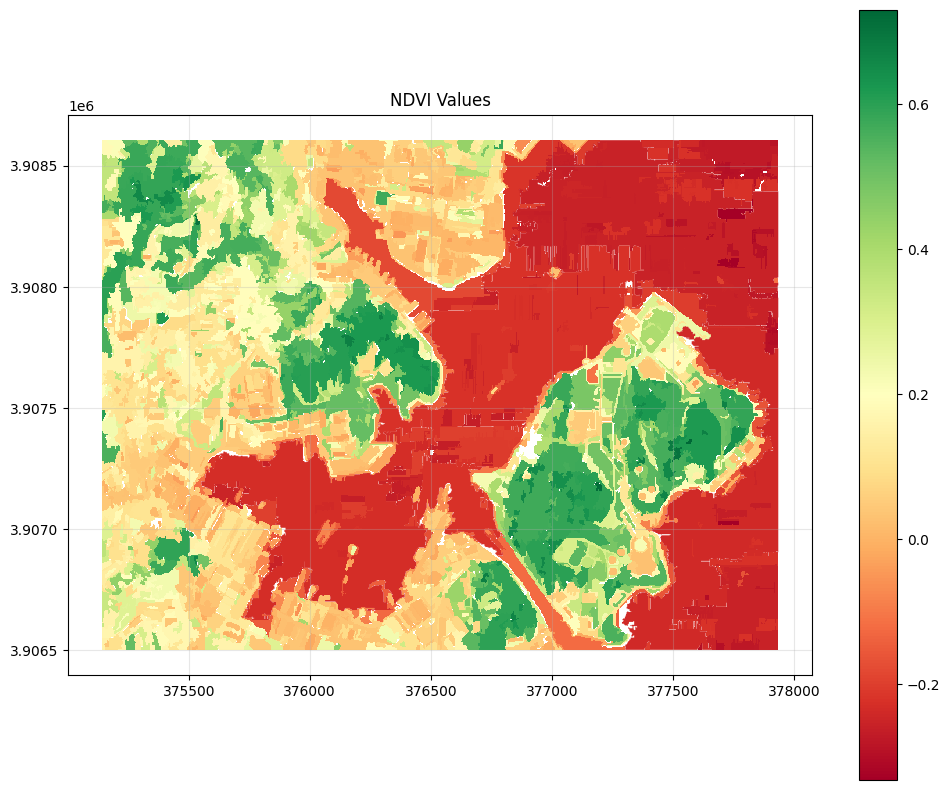

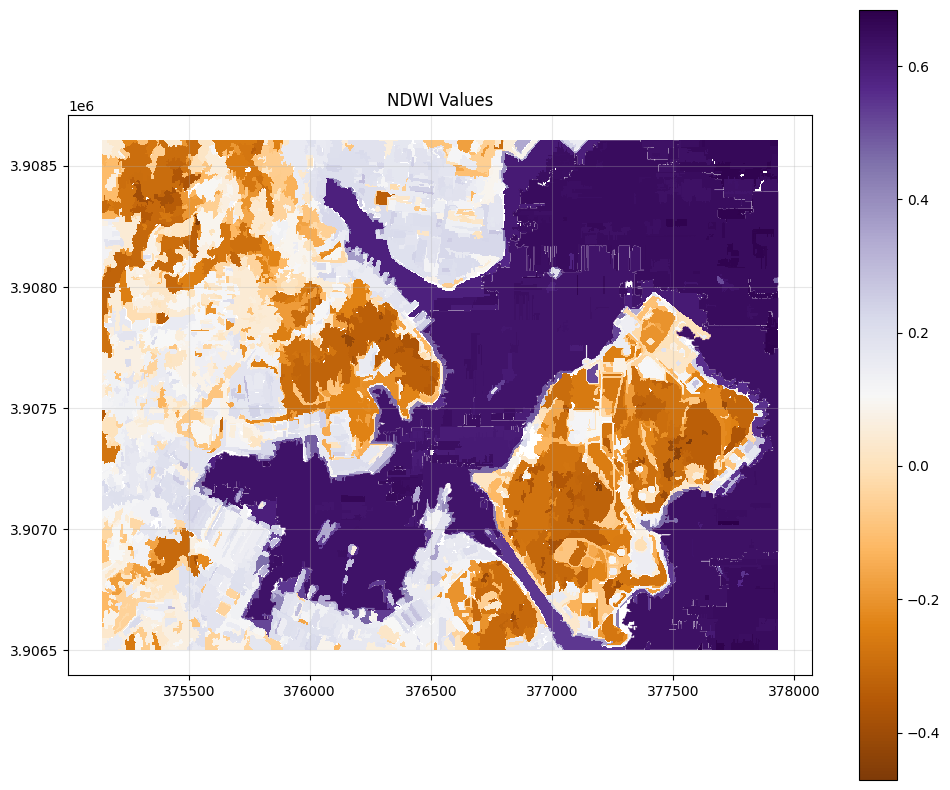

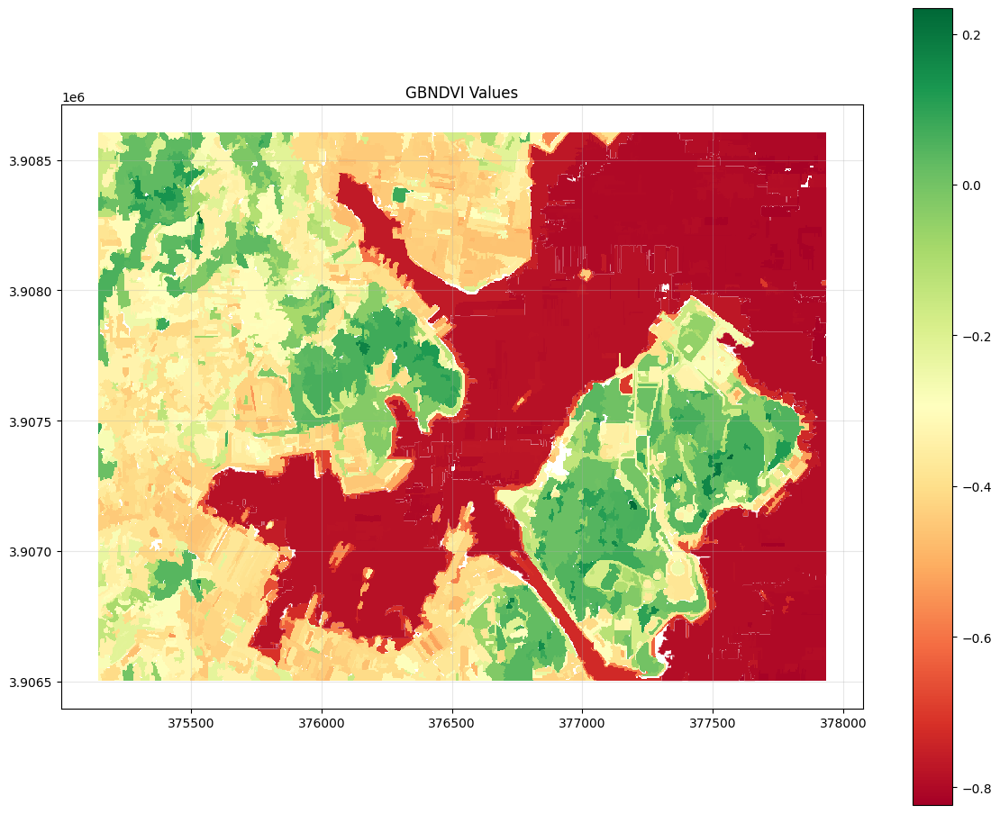

In [ ]:
# Create figure and axes with 1 row and 3 columns
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Spectral Indices', fontsize=16)

# NDVI plot
plot_layer(segmentation_layer,
        attribute="NDVI",
        title="NDVI Values",
        cmap="RdYlGn",
        ax=ax1)

# NDWI plot
plot_layer(segmentation_layer,
        attribute="NDWI",
        title="NDWI Values",
        cmap="PuOr", 
        ax=ax2)

# GBNDVI plot  
plot_layer(segmentation_layer,
        attribute="GBNDVI",
        title="GBNDVI Values", 
        cmap="RdYlGn",
        ax=ax3)

# Adjust layout
plt.tight_layout()
plt.show()

In [62]:
segmentation_layer.metadata

{'algorithm': 'Felzenszwalb',
 'scale': 130,
 'sigma': 1.0,
 'min_size': 50,
 'num_segments_actual': 858}

## Sample data collection

Using plotly package, interactive map is plotted to collect the segments_id(sample) for supervised classification.

Just Hover the mouse in the map, segment_id will be displayed.



In [71]:
plot_layer_interactive_plotly(segmentation_layer,
                              image_data,
                              rgb_bands=(3,2,1),
                              show_boundaries=True,
                              figsize=(900,600))

In [74]:
# Sample Data for Classification
# This section defines the sample data used for classification. 
# Each class is assigned with a list of segment IDs and a specific color for visualization.
samples={
    "Water": [1466,858,191,579,279,205,1370,1646,1160],
    "Builtup": [522,513,423,336,135,32,209,869,1668],
    "Vegetation": [1541,889,422,361,963],
}

classes_color= {
    "Water": "#3437c2",
    "Builtup":"#de1421",
    "Vegetation": "#0f6b2f"
}



### Sample Data Visualization

Visualizing samples

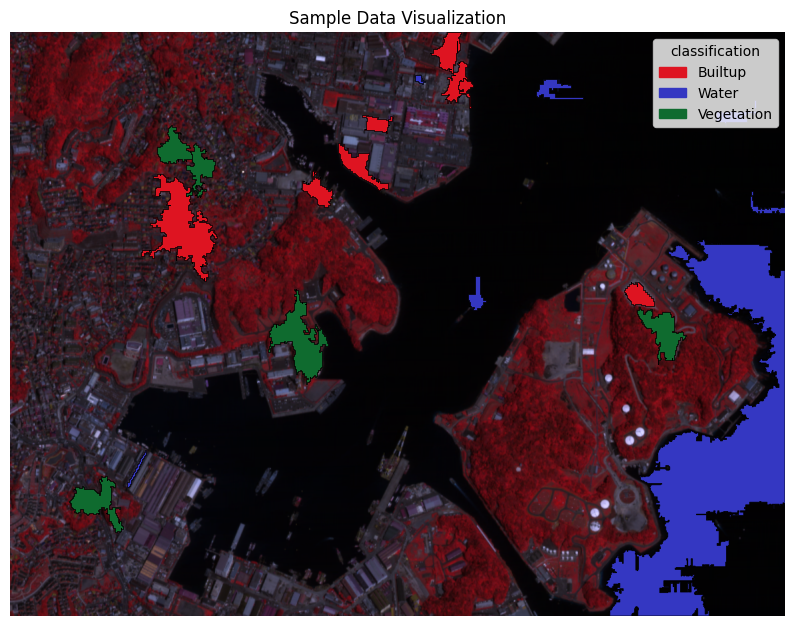

In [73]:
sample_objects = segmentation_layer.objects.copy()
sample_objects["classification"] = None

for class_name in samples.keys():
    sample_objects.loc[sample_objects["segment_id"].isin(samples[class_name]), "classification"] = class_name

# Step 3: Wrap the modified GeoDataFrame back into a Layer
sample_layer = Layer(name="Sample Classification", type="classification")
sample_layer.objects = sample_objects

fig = plot_sample(
    sample_layer,
    image_data=image_data,          
    rgb_bands=(3,2,1),
    transform=transform,          
    class_field="classification",
    class_color=classes_color,
    figsize=(10,8)

)
plt.show()

In [75]:
# To get the columns/features name if the segmentation layer. 
# This is useful to define the features list in the following supervised classification task
segmentation_layer.objects.columns

Index(['segment_id', 'area_pixels', 'area_units', 'geometry', 'band_1_mean',
       'band_1_std', 'band_1_min', 'band_1_max', 'band_1_median',
       'band_2_mean', 'band_2_std', 'band_2_min', 'band_2_max',
       'band_2_median', 'band_3_mean', 'band_3_std', 'band_3_min',
       'band_3_max', 'band_3_median', 'band_4_mean', 'band_4_std',
       'band_4_min', 'band_4_max', 'band_4_median', 'NDVI', 'NDWI', 'GBNDVI',
       'perimeter', 'shape_index', 'compactness'],
      dtype='object')

## Supervised Classification - SVM 

In this step, we will define and execute the supervised classification.

In [94]:
params = {
    "C":1.0,
    "kernel":'rbf',
    "gamma":'scale'
}

# Define features based on which classifier performs the classification
features=['band_1_mean','band_1_std', 'band_2_mean', 'band_2_std', 'band_3_mean',
          'band_3_std',  'band_4_mean', 'band_4_std','NDVI','NDWI', 'GBNDVI']

## Create the Supervised Classifier instance
SVM_classification = SupervisedClassifier(
    name="SVM_Classification",
    classifier_type='SVC',
    classifier_params=params
)

SVM_classification_layer, metrics = SVM_classification.execute(
    source_layer=segmentation_layer,
    samples = samples,
    layer_manager=manager,
    features=features, 
    layer_name="SVM_Classification")

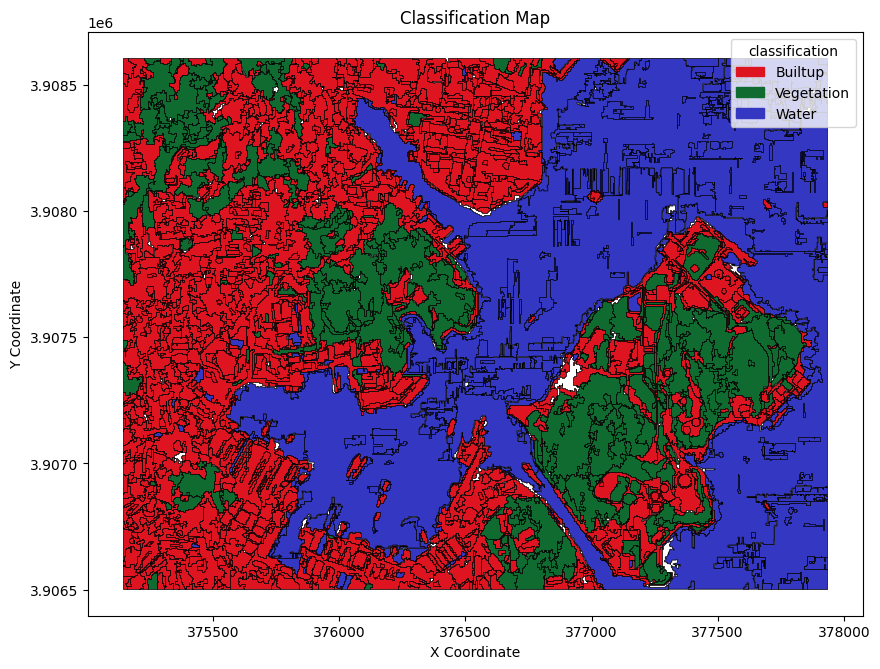

In [95]:
# Plot classification result
fig4 = plot_classification(SVM_classification_layer,
                           class_field="classification",
                           class_color=classes_color,
                           figsize=(10,8))

plt.show()

### Testing different parameters

### Kernels

Running classification with parameters: {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
Running classification with parameters: {'C': 1.0, 'kernel': 'linear', 'gamma': 'scale'}
Running classification with parameters: {'C': 1.0, 'kernel': 'poly', 'degree': 3}
Results layer metada: {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
Results layer metada: {'C': 1.0, 'kernel': 'linear', 'gamma': 'scale'}
Results layer metada: {'C': 1.0, 'kernel': 'poly', 'degree': 3}


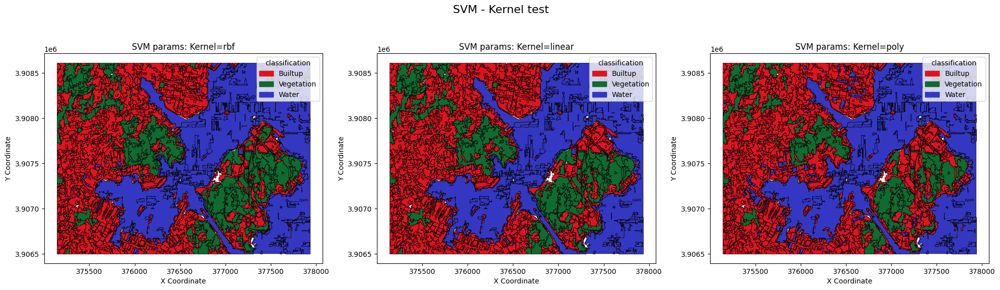

In [ ]:
params1 = {
    "C":1.0,
    "kernel":'rbf',
    "gamma":'scale'
}

pararams2 = {
        "C":1.0,
        "kernel":'linear',
        "gamma":'scale'
}

params3 = {
        "C":1.0,
        "kernel":'poly',
        "degree":3,     
}

list_params = [params1, pararams2, params3]

# Define features based on which classifier performs the classification
features=['band_1_mean','band_1_std', 'band_2_mean', 'band_2_std', 'band_3_mean',
          'band_3_std',  'band_4_mean', 'band_4_std','NDVI','NDWI', 'GBNDVI']

list_results = []
for params in list_params:
        print(f"Running classification with parameters: {params}")
        # Create the Supervised Classifier instance
        SVM_classification = SupervisedClassifier(
                name="SVM_Classification",
                classifier_type='SVC',
                classifier_params=params
        )

        SVM_classification_layer, metrics = SVM_classification.execute(
                source_layer=segmentation_layer,
                samples = samples,
                layer_manager=manager,
                features=features, 
                layer_name="SVM_Classification",
        )
        
        list_results.append(SVM_classification_layer)

print("------------------------------------------")
## FIGURE 
# Create figure and axes with 1 row and 3 columns
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('SVM - Kernel test', fontsize=16)

for results, _ax in zip(list_results, [ax1, ax2, ax3]):
        print(f"Results layer metada: {results.metadata['classifier_params']}")
        # Plot classification result
        
        print(f"Accuracy results from cross-val score: {results.metadata['metrics']['test_accuracy']}")
        print(f"Feature importance - (permutation) : {results.metadata['metrics']['feature_importances']}")
        plot_classification(results,
                        class_field="classification",
                        class_color=classes_color,
                        figsize=(10,8),
                        ax=_ax,
                        title = f"SVM params: Kernel={results.metadata['classifier_params']['kernel']}")

# Adjust layout
plt.tight_layout()
plt.show()

### Parameter C


Running classification with parameters: {'C': 10.0, 'kernel': 'rbf', 'gamma': 'scale'}
Running classification with parameters: {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
Running classification with parameters: {'C': 0.1, 'kernel': 'rbf', 'degree': 3}
Results layer metada: {'C': 10.0, 'kernel': 'rbf', 'gamma': 'scale'}
Results layer metada: {'C': 1.0, 'kernel': 'rbf', 'gamma': 'scale'}
Results layer metada: {'C': 0.1, 'kernel': 'rbf', 'degree': 3}


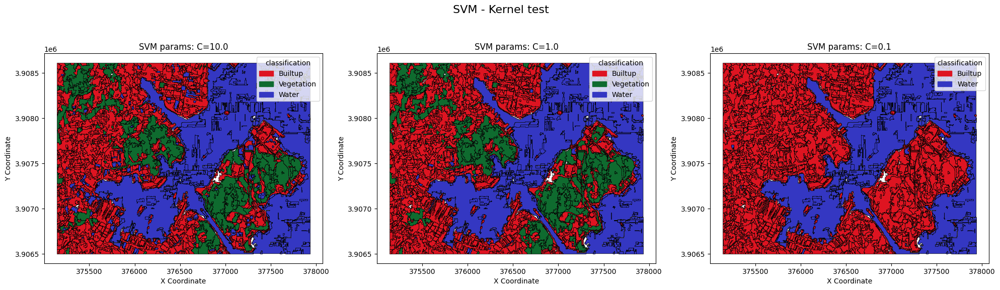

In [ ]:
params1 = {
    "C":10.0,
    "kernel":'rbf',
    "gamma":'scale'
}

pararams2 = {
        "C":1.0,
        "kernel":'rbf',
        "gamma":'scale'
}

params3 = {
        "C":0.1,
        "kernel":'rbf',
        "degree":3,     
}

list_params = [params1, pararams2, params3]

# Define features based on which classifier performs the classification
features=['band_1_mean','band_1_std', 'band_2_mean', 'band_2_std', 'band_3_mean',
          'band_3_std',  'band_4_mean', 'band_4_std','NDVI','NDWI', 'GBNDVI']

list_results = []
for params in list_params:
        print(f"Running classification with parameters: {params}")
        # Create the Supervised Classifier instance
        SVM_classification = SupervisedClassifier(
                name="SVM_Classification",
                classifier_type='SVC',
                classifier_params=params
        )

        SVM_classification_layer, metrics = SVM_classification.execute(
                source_layer=segmentation_layer,
                samples = samples,
                layer_manager=manager,
                features=features, 
                layer_name="SVM_Classification",
        )
        
        list_results.append(SVM_classification_layer)

## FIGURE 
# Create figure and axes with 1 row and 3 columns
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('SVM - Kernel test', fontsize=16)

for results, _ax in zip(list_results, [ax1, ax2, ax3]):
        print(f"Results layer metada: {results.metadata['classifier_params']}")
        # Plot classification result
        
        print(f"Accuracy results from cross-val score: {results.metadata['metrics']['test_accuracy']}")
        print(f"Feature importance - (permutation) : {results.metadata['metrics']['feature_importances']}")
       
        plot_classification(results,
                        class_field="classification",
                        class_color=classes_color,
                        figsize=(10,8),
                        ax=_ax,
                        title = f"SVM params: C={results.metadata['classifier_params']['C']}")

# Adjust layout
plt.tight_layout()
plt.show()

## Applying merge rule
In this step we will further refine the classification. 
In this example, we will merge region based on class value i.e. merge adjacent segments if they share the same class label.

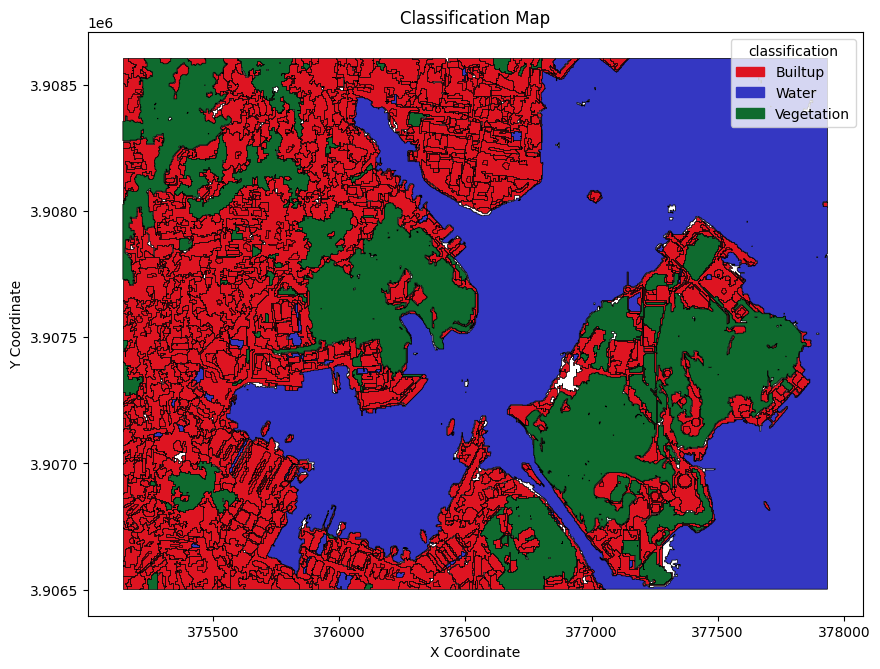

In [ ]:
merger = MergeRuleSet("Merge Segmentation")
class_value=["Water","Vegetation"]
merged_layer = merger.execute(
    source_layer=SVM_classification_layer,
    class_column_name="classification",
    class_value=class_value,
    layer_manager=manager,
    layer_name="Merged SVM Classification",
)
fig4 = plot_classification(merged_layer, class_field="classification", class_color=classes_color,figsize=(10,8))


## Applying Enclosed_by rule
This rule is also applied based on class label. This function determine whether a object/segment is completely contained/surrounded within/by another object or class and return the updated layer.

This function is very helpful in applying the context-aware rules in classification.

In this example, we define the new class "Urban Vegetation" if "Vegetation" is enclosed by "Builtup".


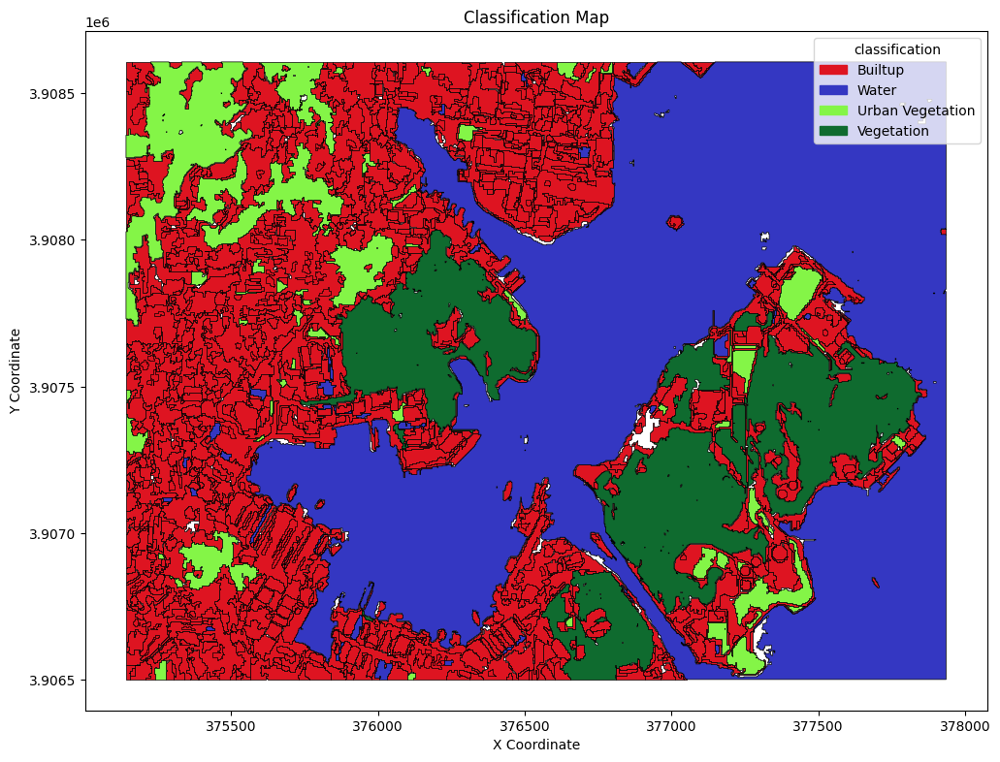

In [97]:
enclosed_by_rule = EnclosedByRuleSet()
enclosed_by_layer = enclosed_by_rule.execute(
    source_layer=merged_layer,
    class_column_name="classification",
    class_value_a="Vegetation",
    class_value_b="Builtup",
    new_class_name="Urban Vegetation",
    layer_manager=manager,
    layer_name="enclosed_by_layer",
)
classes_color["Urban Vegetation"]="#84f547"
fig4 = plot_classification(enclosed_by_layer, class_field="classification", class_color=classes_color)

## Applying Touched_by rule
This rule is also applied based on class labels. This determines whether an object/segment is in direct contact with another object or class — that is, they share a boundary.

This function is very useful in implementing context-aware rules in classification, especially when spatial relationships between features matter.

In this example, we define a new class "Builtup near WaterBodies" if "Builtup" is touchedBy "Water".


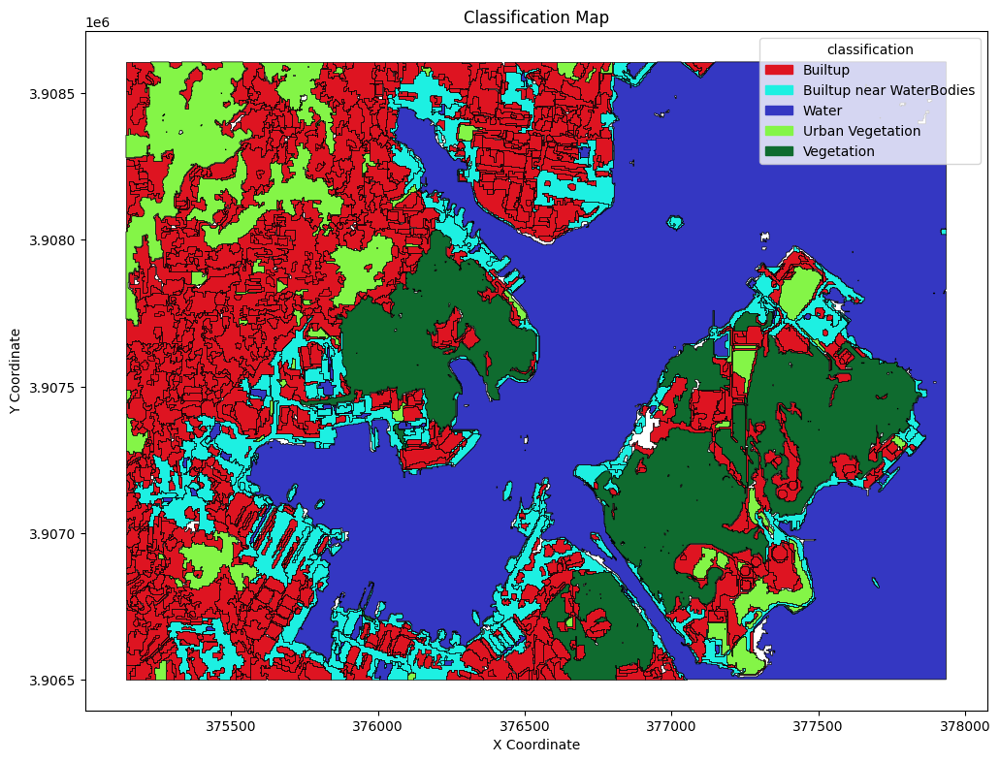

In [98]:
touched_by_rule = TouchedByRuleSet()
touched_by_layer = touched_by_rule.execute(
    source_layer=enclosed_by_layer,
    class_column_name="classification",
    class_value_a="Builtup",
    class_value_b="Water",
    new_class_name="Builtup near WaterBodies",
    layer_manager=manager,
    layer_name="touched_by_layer",
)
classes_color["Builtup near WaterBodies"]="#1df0e2"
fig4 = plot_classification(touched_by_layer, class_field="classification", class_color=classes_color)

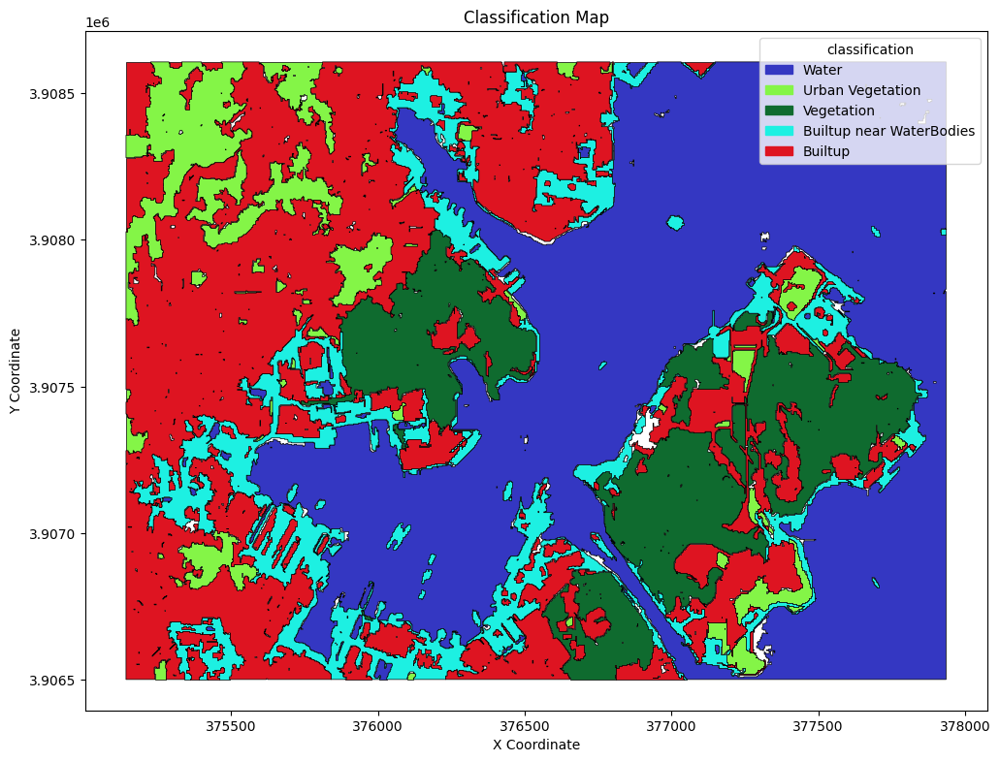

In [99]:
# Applying merge rule to generate the final merged segments
merge_rule = MergeRuleSet("MergeByVegAndType")
merged_layer2 = merger.execute(
    source_layer=touched_by_layer,
    class_column_name="classification",
    class_value=["Builtup near WaterBodies","Builtup"],
    layer_manager=manager,
    layer_name="Merged RF Classification 2",
)
fig4 = plot_classification(merged_layer2, class_field="classification", class_color=classes_color)